# Mount the drive

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
%cd /content/gdrive/MyDrive/HandsDetectionYolov5

/content/gdrive/MyDrive/HandsDetectionYolov5


#Install dependecies

In [4]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 12447, done.
remote: Total 12447 (delta 0), reused 0 (delta 0), pack-reused 12447
Receiving objects: 100% (12447/12447), 12.15 MiB | 4.98 MiB/s, done.
Resolving deltas: 100% (8591/8591), done.
/content/gdrive/MyDrive/HandsDetectionYolov5/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [5]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 596 kB 36.5 MB/s 
Setup complete. Using torch 1.11.0+cu113 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


# Get dataset from Roboflow

In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="api")
project = rf.workspace().project("egohandscsv")
dataset = project.version(1).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 145 kB 37.7 MB/s 
     |████████████████████████████████| 178 kB 61.4 MB/s 
     |████████████████████████████████| 3.1 MB 52.9 MB/s 
     |████████████████████████████████| 1.1 MB 56.8 MB/s 
     |████████████████████████████████| 21.8 MB 1.3 MB/s 
     |████████████████████████████████| 67 kB 7.3 MB/s 
     |████████████████████████████████| 54 kB 3.5 MB/s 
     |████████████████████████████████| 138 kB 70.9 MB/s 
     |████████████████████████████████| 62 kB 1.8 MB/s 
  Created wheel for roboflow: filename=roboflow-0.2.7-py3-none-any.whl size=24049 sha256=2fcdf073dcdd57b21180e2d9b7d1fe35805aa350b7769d5988cb0f8bd723d3dd
  Stored in directory: /root/.cache/pip/wheels/e6/e3/d6/a142059abb9cc856d3c499a9f6f354d6bcd34ba971addce12b
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=d9a66f25edd2ba0162f3ada79d8cf4bcef75f3a16cbe2e

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to EgoHandsCSV-1 in yolov5pytorch:: 100%|██████████| 9586/9586 [01:35<00:00, 100.65it/s]


In [9]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- myleft
- myright
- yourleft
- yourright
nc: 4
train: EgoHandsCSV-1/train/images
val: EgoHandsCSV-1/valid/images


#Define Model Configuration and Architecture

In [10]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [11]:
#this is the model configuration we will use 
%cat /content/gdrive/MyDrive/HandsDetectionYolov5/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [12]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [13]:
%%writetemplate /content/gdrive/MyDrive/HandsDetectionYolov5/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [14]:
%cd /content/gdrive/MyDrive/HandsDetectionYolov5/yolov5

/content/gdrive/MyDrive/HandsDetectionYolov5/yolov5


In [15]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
!python train.py --img 640 --batch 64 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

github: ⚠️ WARNING: code is out of date by 1149 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, batch_size=64, bucket='', cache_images=True, cfg='./models/custom_yolov5s.yaml', data='/content/gdrive/MyDrive/HandsDetectionYolov5/yolov5/EgoHandsCSV-1/data.yaml', device='', entity=None, epochs=100, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[640, 640], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5s_results', single_cls=False, sync_bn=False, total_batch_size=64, weights='', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recomm

In [16]:
# evaluate model
!python test.py --data {dataset.location}/data.yaml --weights /content/gdrive/MyDrive/HandsDetectionYolov5/yolov5/runs/train/yolov5s_results/weights/best.pt

Namespace(augment=False, batch_size=32, conf_thres=0.001, data='/content/gdrive/MyDrive/HandsDetectionYolov5/yolov5/EgoHandsCSV-1/data.yaml', device='', exist_ok=False, img_size=640, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', verbose=False, weights=['/content/gdrive/MyDrive/HandsDetectionYolov5/yolov5/runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7254609 parameters, 0 gradients, 16.8 GFLOPS
val: Scanning 'EgoHandsCSV-1/valid/labels.cache' for images and labels

# Evaluate Custom YOLOv5 Detector Performance

In [17]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

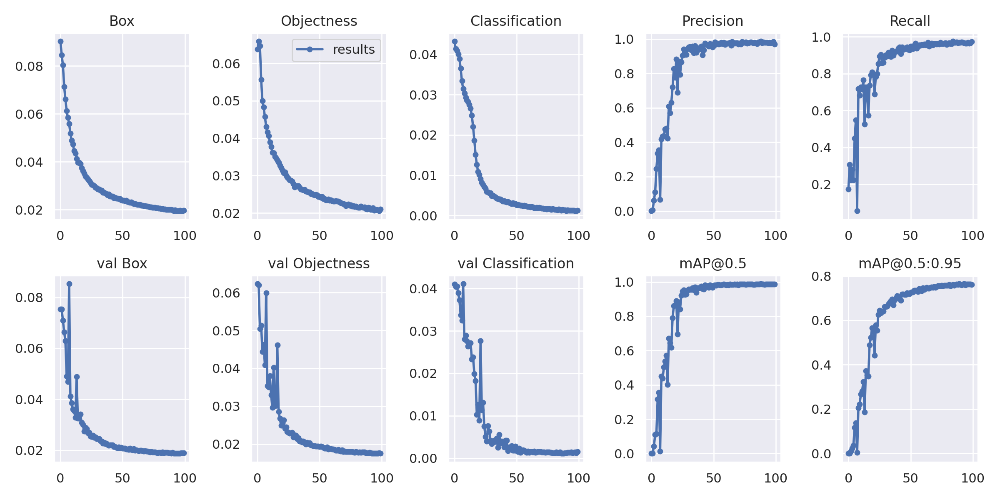

In [19]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/gdrive/MyDrive/HandsDetectionYolov5/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


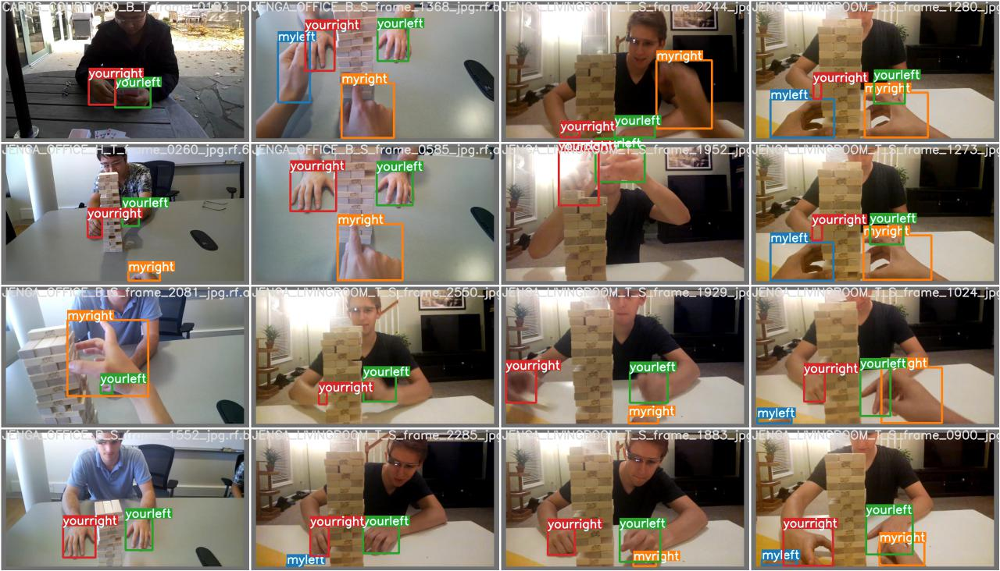

In [20]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/gdrive/MyDrive/HandsDetectionYolov5/yolov5/runs/train/yolov5s_results/test_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


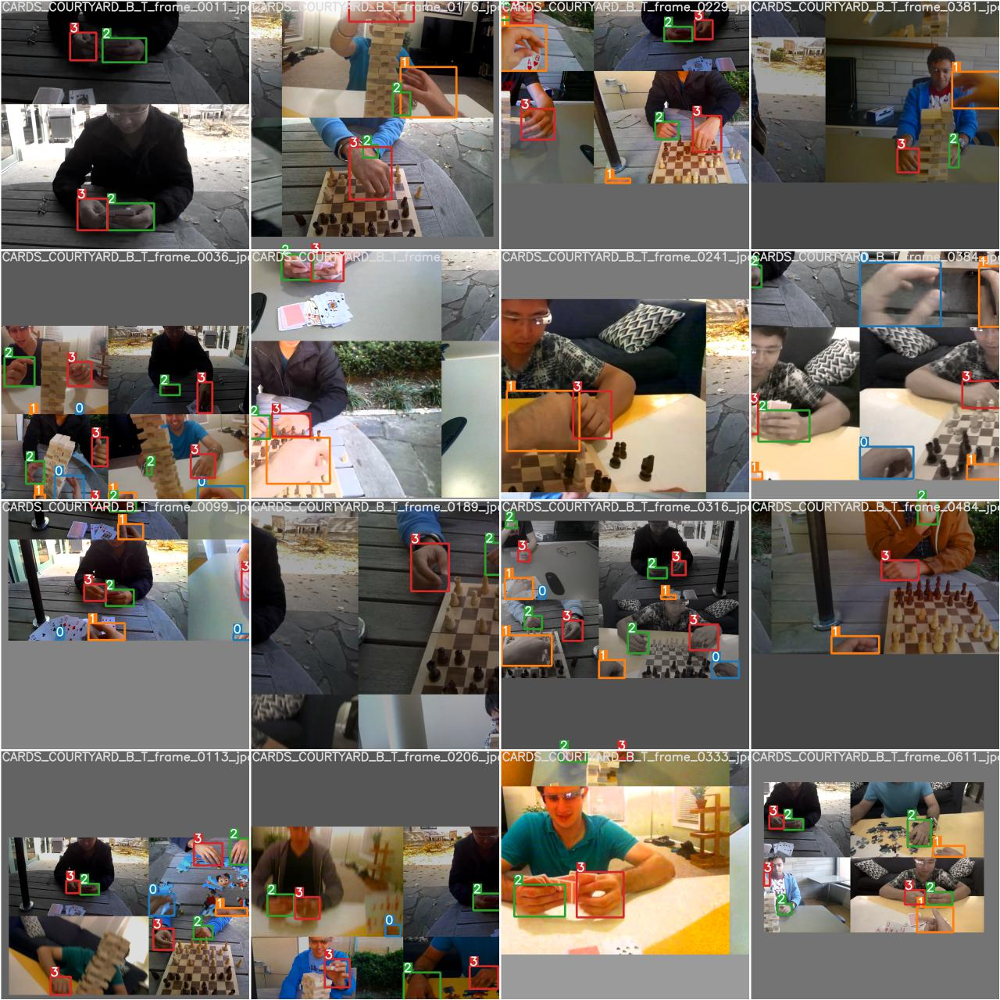

In [21]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/gdrive/MyDrive/HandsDetectionYolov5/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [22]:
# trained weights are saved by default in our weights folder
%ls runs/

test/  train/


best.pt are the weights of the model from which running inference

In [23]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [24]:
%cd /content/gdrive/MyDrive/HandsDetectionYolov5/yolov5

/content/gdrive/MyDrive/HandsDetectionYolov5/yolov5


In [26]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights and select the confidence threshold
!python detect.py --weights /content/gdrive/MyDrive/HandsDetectionYolov5/yolov5/runs/train/yolov5s_results/weights/best.pt --img 640 --conf 0.45 --source ../test_images

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.45, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../test_images', update=False, view_img=False, weights=['/content/gdrive/MyDrive/HandsDetectionYolov5/yolov5/runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7254609 parameters, 0 gradients, 16.8 GFLOPS
image 1/20 /content/gdrive/MyDrive/HandsDetectionYolov5/yolov5/../test_images/01.jpg: 384x640 1 myright, 1 yourleft, 1 yourright, Done. (0.056s)
image 2/20 /co

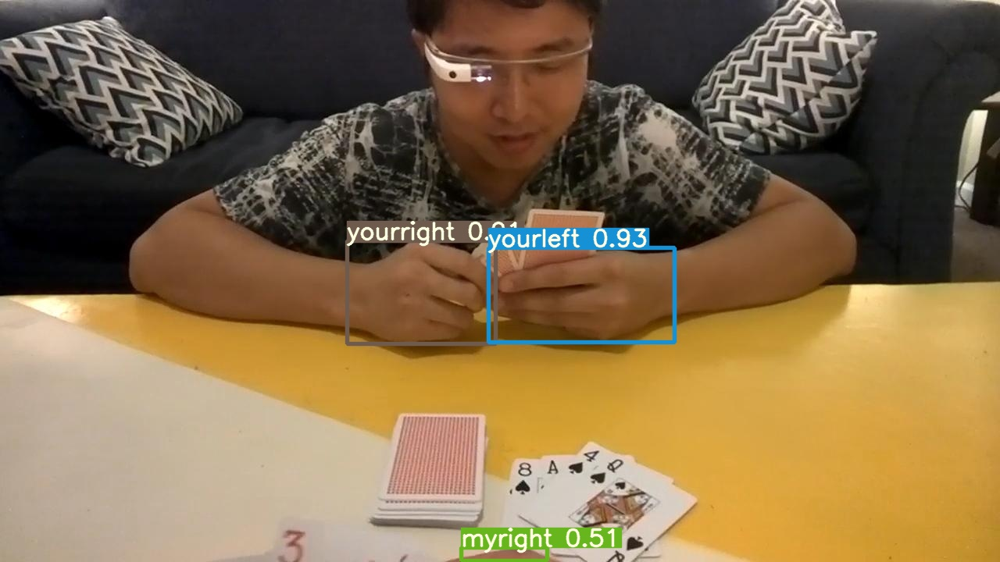

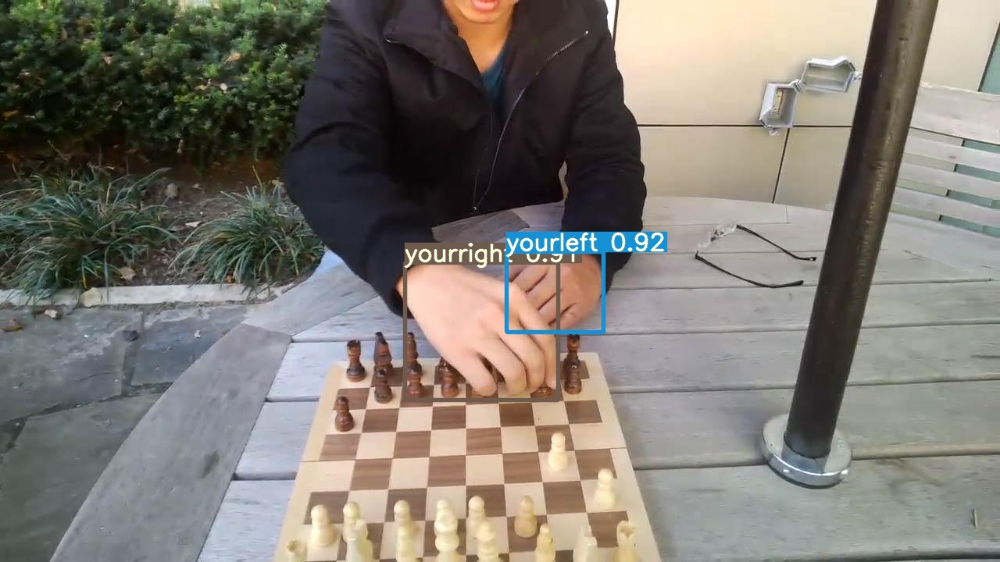

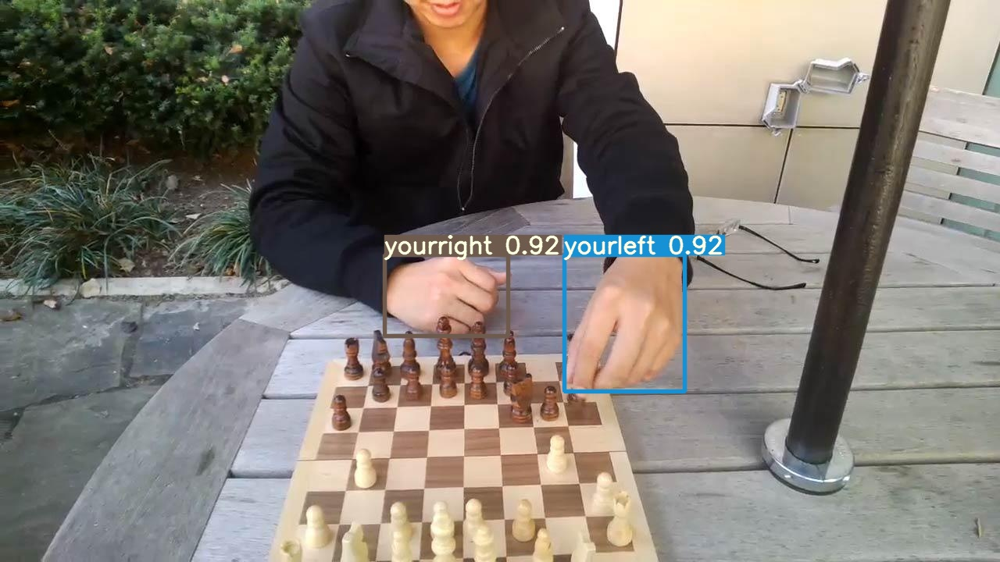

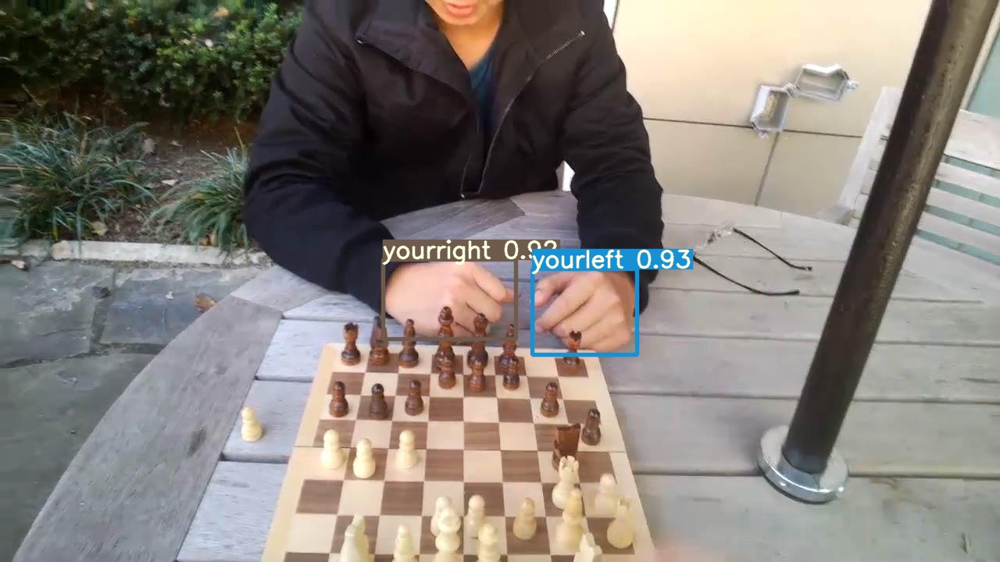

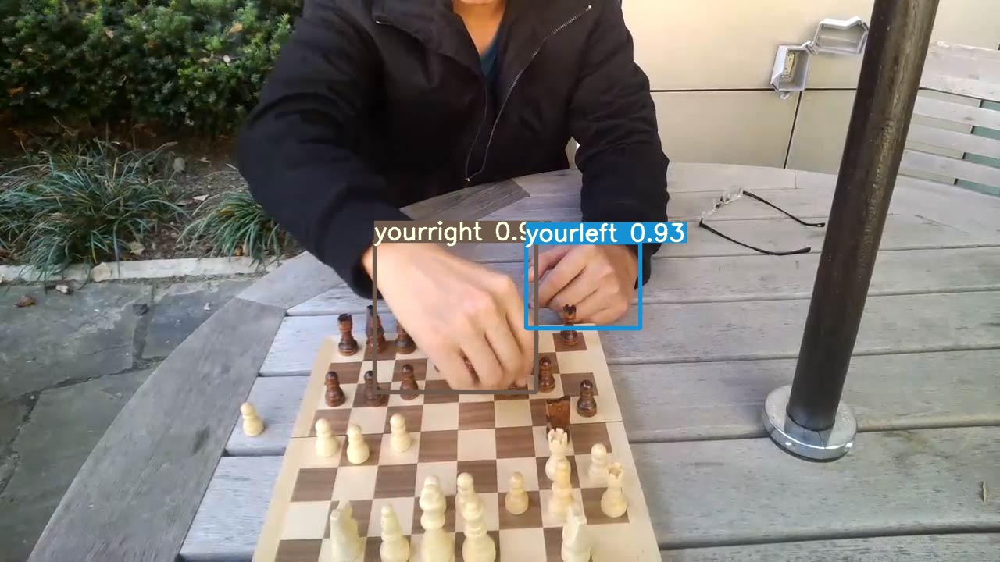

...

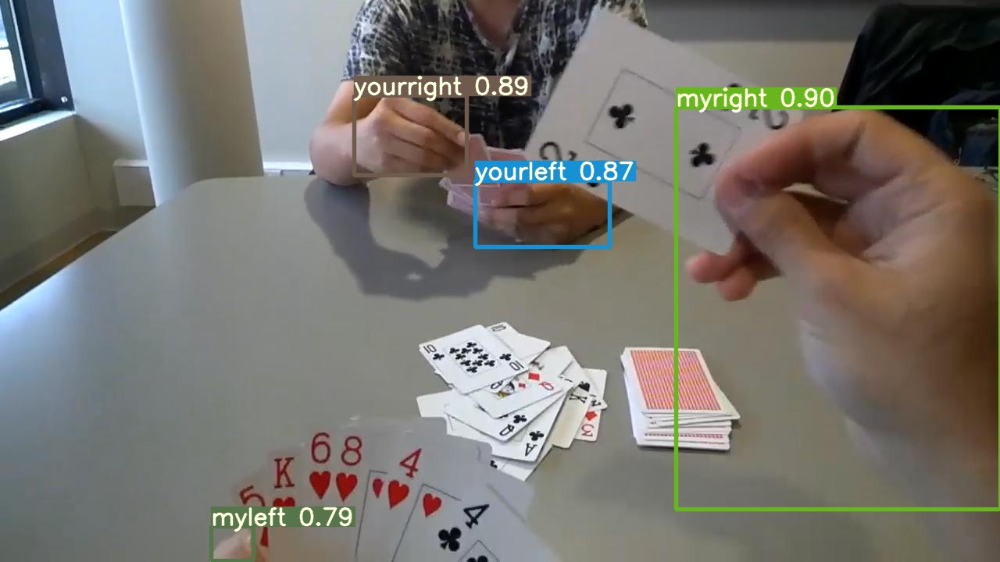

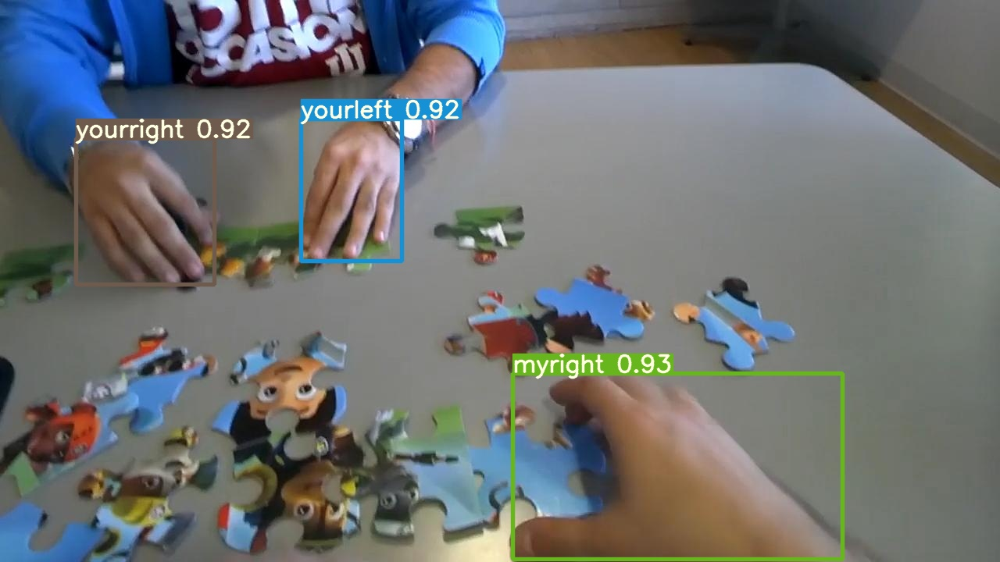

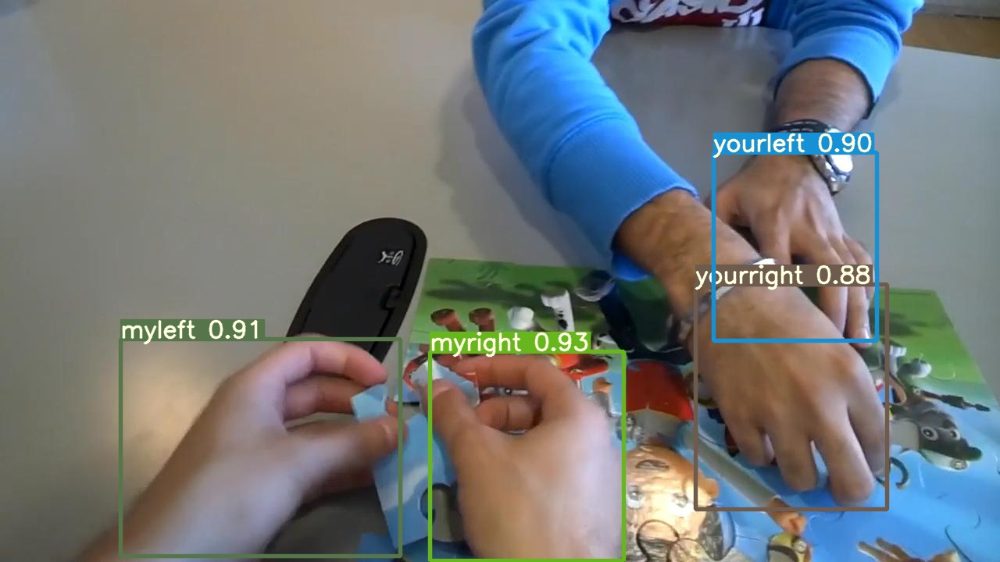

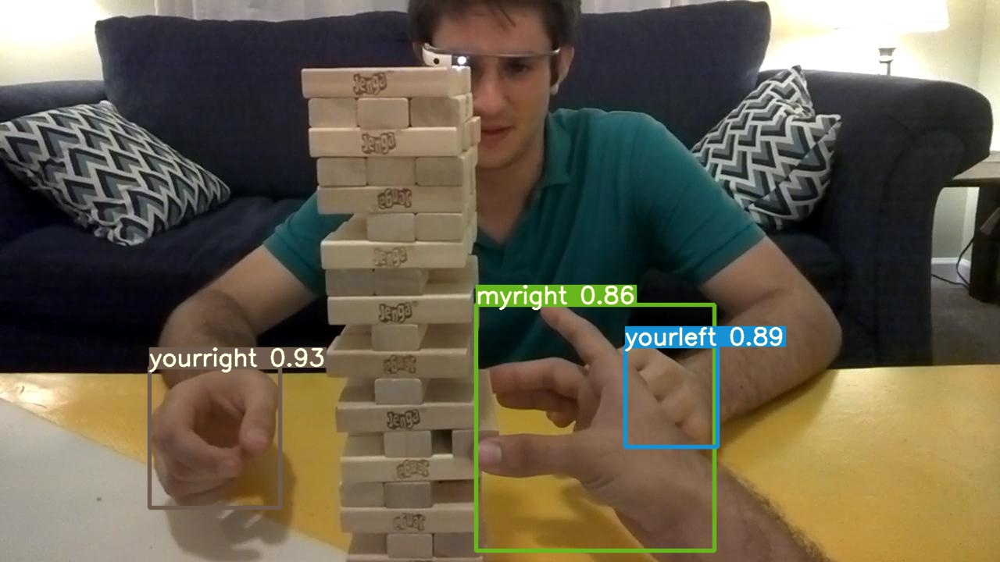

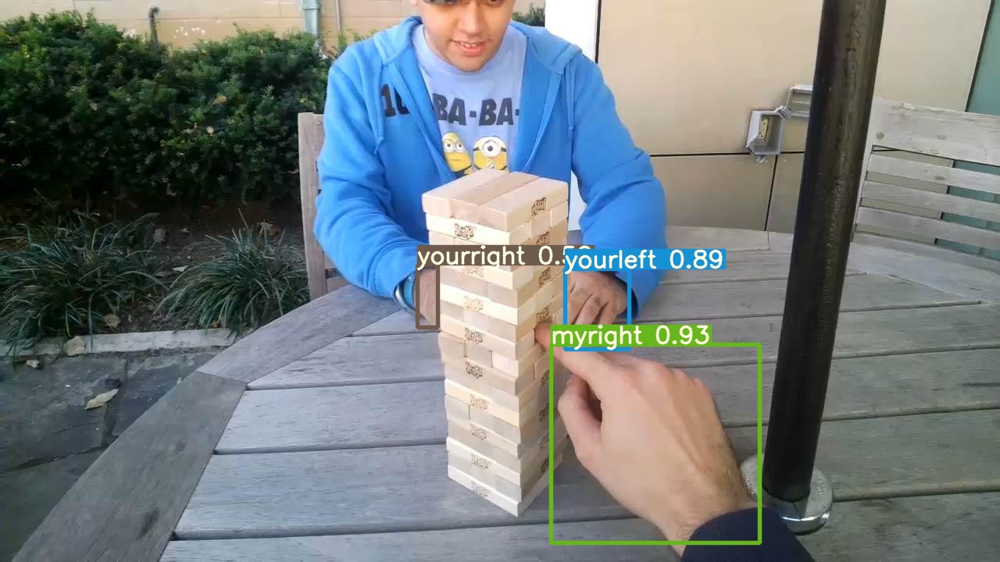

In [28]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/gdrive/MyDrive/HandsDetectionYolov5/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

Export the model from PyTorch to ONNX format

In [4]:
%cd /content/gdrive/MyDrive/HandsDetectionYolov5/export_to_onnx

/content/gdrive/MyDrive/HandsDetectionYolov5/export_to_onnx


In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt
!pip install onnx

In [ ]:
%cd models
!wget https://github.com/ultralytics/yolov5/releases/download/v6.1/yolov5n.pt -nv
!wget https://github.com/ultralytics/yolov5/releases/download/v6.1/yolov5s.pt -nv
!wget https://github.com/ultralytics/yolov5/releases/download/v6.1/yolov5m.pt -nv
!wget https://github.com/ultralytics/yolov5/releases/download/v6.1/yolov5l.pt -nv
!wget https://github.com/ultralytics/yolov5/releases/download/v6.1/yolov5x.pt -nv
%cd ..

In [8]:
!cp /content/gdrive/MyDrive/HandsDetectionYolov5/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/MyDrive/HandsDetectionYolov5/export_to_onnx/yolov5/models

In [10]:
# The default input size is 640x640.
!python export.py --weights models/best.pt --include onnx --opset 12

# Add the flag --imsz to export for custom input size.
# !python export.py --weights models/yolov5n.pt --include onnx --imsz 320 320

# Add the flag --dyanamic for dynamic input size. Compatible with ONNX runtime.
# !python export.py --weights models/yolov5n.pt --include onnx --dynamic

export: data=data/coco128.yaml, weights=['models/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, train=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['onnx']
YOLOv5 🚀 v6.1-289-g526e650 Python-3.7.13 torch-1.11.0+cu113 CPU

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7254609 parameters, 0 gradients

PyTorch: starting from models/best.pt with output shape (1, 25200, 9) (14.1 MB)

ONNX: starting export with onnx 1.12.0...
/content/gdrive/MyDrive/HandsDetectionYolov5/export_to_onnx/yolov5/models/common.py:278: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch